<a href="https://colab.research.google.com/github/Faisal-Al-Mamun/Image_Segmentation_from_Image_and_Video_Files_with_Mask_R-CNN/blob/main/Image_Segmentation_from_Image_Files_with_Mask_R_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Downloading the repository

In [ ]:
!git clone https://github.com/matterport/Mask_RCNN

Cloning into 'Mask_RCNN'...
remote: Enumerating objects: 956, done.
remote: Total 956 (delta 0), reused 0 (delta 0), pack-reused 956
Receiving objects: 100% (956/956), 125.23 MiB | 39.52 MiB/s, done.
Resolving deltas: 100% (565/565), done.


In [ ]:
%cd Mask_RCNN

/content/Mask_RCNN


In [ ]:
pwd

'/content/Mask_RCNN'

In [ ]:
!python setup.py install

/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:700: UserWarning: Usage of dash-separated 'description-file' will not be supported in future versions. Please use the underscore name 'description_file' instead
  % (opt, underscore_opt))
/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:700: UserWarning: Usage of dash-separated 'license-file' will not be supported in future versions. Please use the underscore name 'license_file' instead
  % (opt, underscore_opt))
/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:700: UserWarning: Usage of dash-separated 'requirements-file' will not be supported in future versions. Please use the underscore name 'requirements_file' instead
  % (opt, underscore_opt))
running install
running bdist_egg
running egg_info
creating mask_rcnn.egg-info
writing mask_rcnn.egg-info/PKG-INFO
writing dependency_links to mask_rcnn.egg-info/dependency_links.txt
writing top-level names to mask_rcnn.egg-info/top_level.txt
writing manifest file 'ma

In [ ]:
%cd ..

/content


In [ ]:
pwd

'/content'

## Importing the libraries

In [ ]:
import os
import sys
import cv2
import numpy as np
import skimage.io
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

%matplotlib inline 

In [ ]:
%tensorflow_version 1.x
import tensorflow as tf

TensorFlow 1.x selected.


In [ ]:
tf.__version__

'1.15.2'

In [ ]:
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
# Root directory of the project
ROOT_DIR = os.path.abspath("./Mask_RCNN")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library

from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize

# Import COCO config
sys.path.append(os.path.join(ROOT_DIR, "samples/coco/"))  # To find local version
import coco

Using TensorFlow backend.


In [ ]:
# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, 'logs')

# Directory of images to run detection on
IMAGE_DIR = os.path.join(ROOT_DIR, 'images')

In [ ]:
MODEL_DIR, IMAGE_DIR

('/content/Mask_RCNN/logs', '/content/Mask_RCNN/images')

## Loading the pre-trained neural network

In [ ]:
# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, 'mask_rcnn_coco.h5')

In [ ]:
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

In [ ]:
class InferenceConfig(coco.CocoConfig):
  GPU_COUNT = 1
  IMAGES_PER_GPU = 1

In [ ]:
config = InferenceConfig()

In [ ]:
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                93
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [ ]:
# Create model object in inference mode.
model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=config)

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.


In [ ]:
!pip install h5py==2.10.0 
#higher version shows error in colab

     |████████████████████████████████| 2.9 MB 24.0 MB/s 
  Attempting uninstall: h5py
    Found existing installation: h5py 3.1.0
    Uninstalling h5py-3.1.0:
      Successfully uninstalled h5py-3.1.0


In [ ]:
# Load weights trained on MS-COCO
model.load_weights(COCO_MODEL_PATH, by_name=True)

In [ ]:
# COCO Class names
# Index of the class in the list is its ID. For example, to get ID of
# the teddy bear class, use: class_names.index('teddy bear')
class_names = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
               'bus', 'train', 'truck', 'boat', 'traffic light',
               'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
               'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
               'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
               'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
               'kite', 'baseball bat', 'baseball glove', 'skateboard',
               'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
               'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
               'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
               'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
               'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
               'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
               'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
               'teddy bear', 'hair drier', 'toothbrush']

In [ ]:
len(class_names)

81

In [ ]:
class_names[1], class_names.index('person')

('person', 1)

# Image Segmentation in Image Files

### Prediction and Visualization

In [ ]:
images = [os.path.join('/content/Mask_RCNN/images', f) for f in os.listdir('/content/Mask_RCNN/images')]
images

['/content/Mask_RCNN/images/9247489789_132c0d534a_z.jpg',
 '/content/Mask_RCNN/images/6821351586_59aa0dc110_z.jpg',
 '/content/Mask_RCNN/images/9118579087_f9ffa19e63_z.jpg',
 '/content/Mask_RCNN/images/8734543718_37f6b8bd45_z.jpg',
 '/content/Mask_RCNN/images/8699757338_c3941051b6_z.jpg',
 '/content/Mask_RCNN/images/8239308689_efa6c11b08_z.jpg',
 '/content/Mask_RCNN/images/3627527276_6fe8cd9bfe_z.jpg',
 '/content/Mask_RCNN/images/5951960966_d4e1cda5d0_z.jpg',
 '/content/Mask_RCNN/images/12283150_12d37e6389_z.jpg',
 '/content/Mask_RCNN/images/3651581213_f81963d1dd_z.jpg',
 '/content/Mask_RCNN/images/25691390_f9944f61b5_z.jpg',
 '/content/Mask_RCNN/images/262985539_1709e54576_z.jpg',
 '/content/Mask_RCNN/images/3800883468_12af3c0b50_z.jpg',
 '/content/Mask_RCNN/images/2383514521_1fc8d7b0de_z.jpg',
 '/content/Mask_RCNN/images/8512296263_5fc5458e20_z.jpg',
 '/content/Mask_RCNN/images/4782628554_668bc31826_z.jpg',
 '/content/Mask_RCNN/images/3132016470_c27baa00e8_z.jpg',
 '/content/Mask_RCN

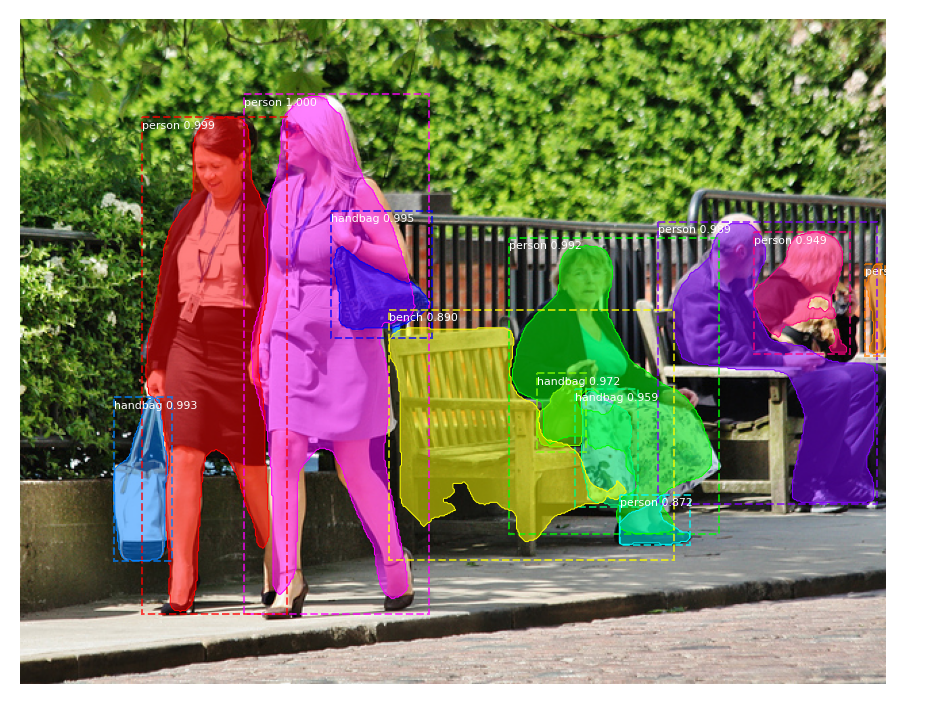

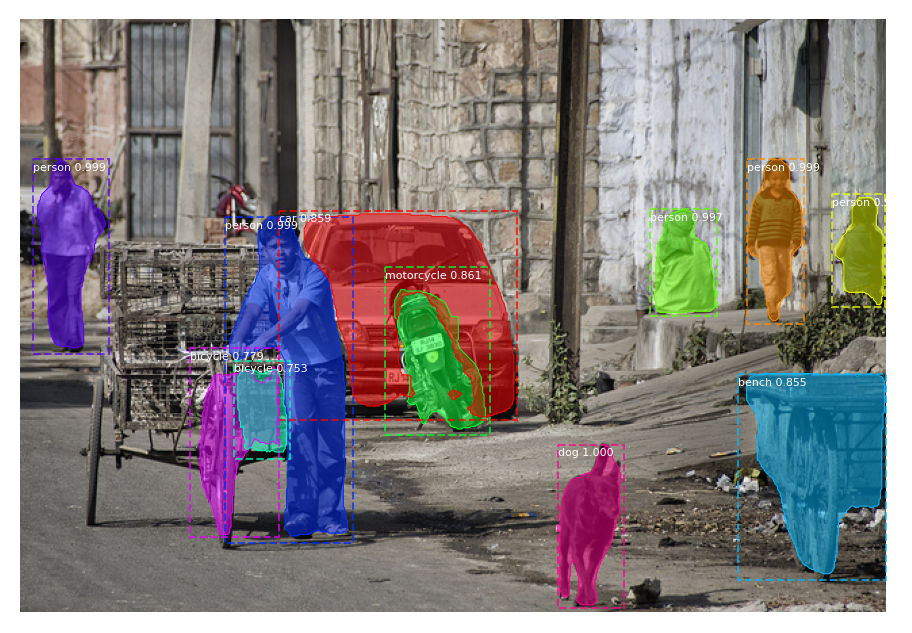

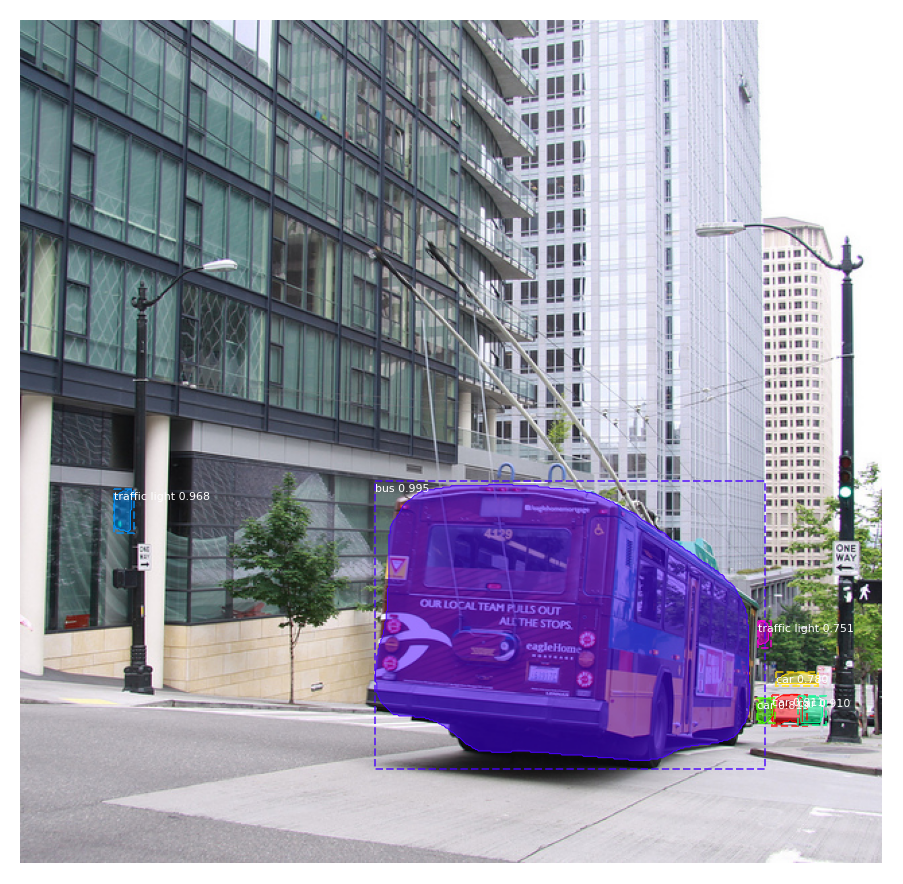

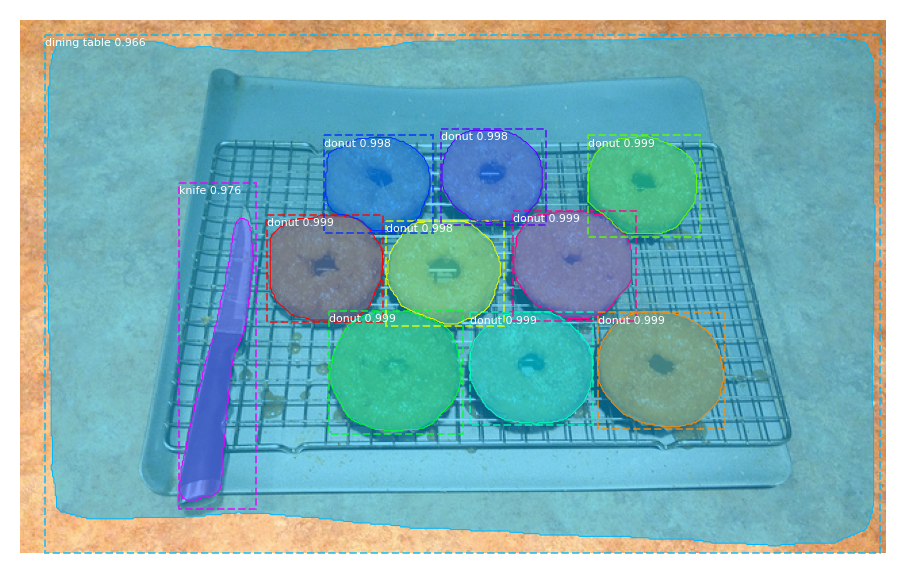

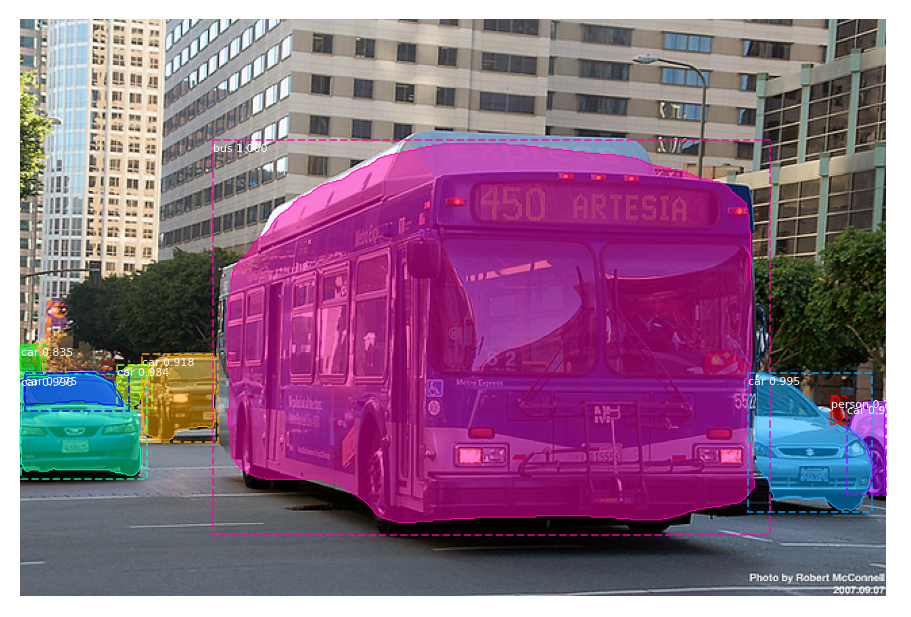

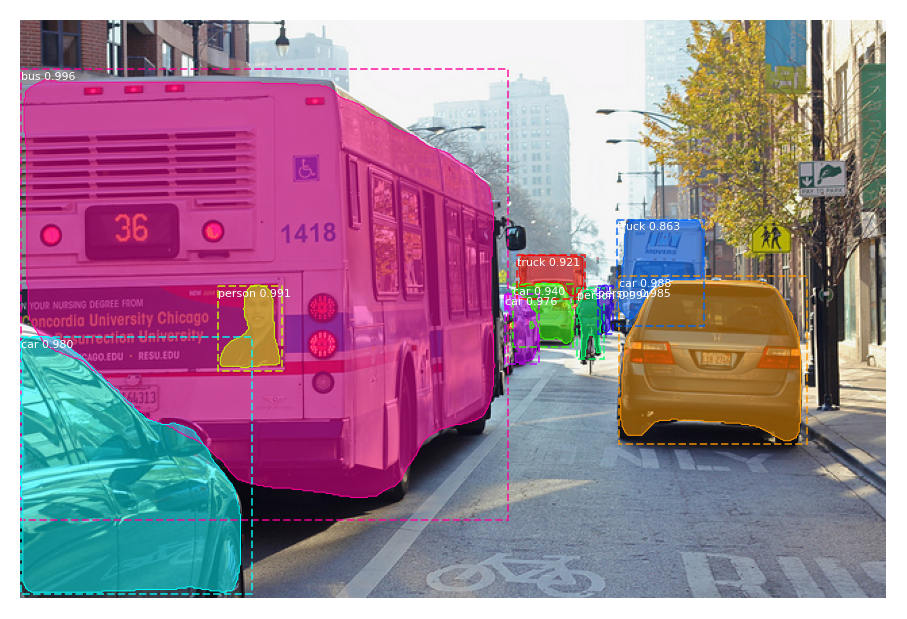

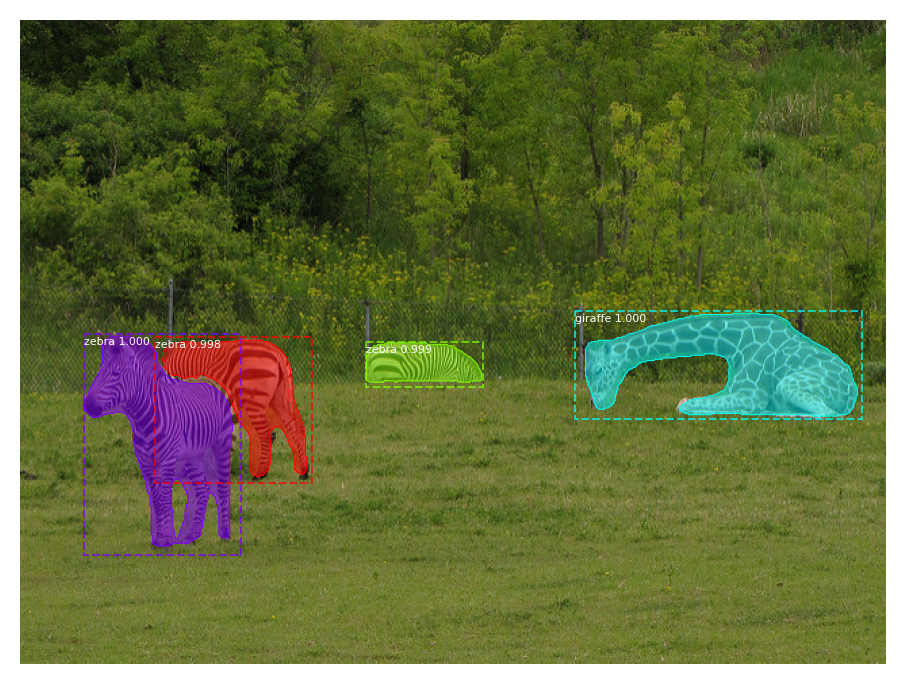

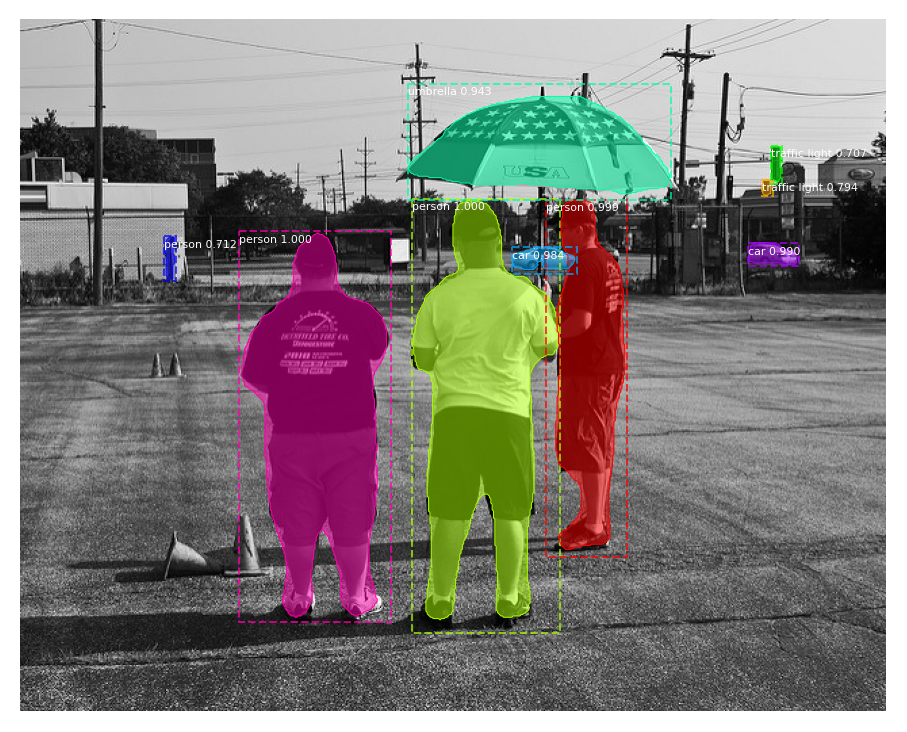

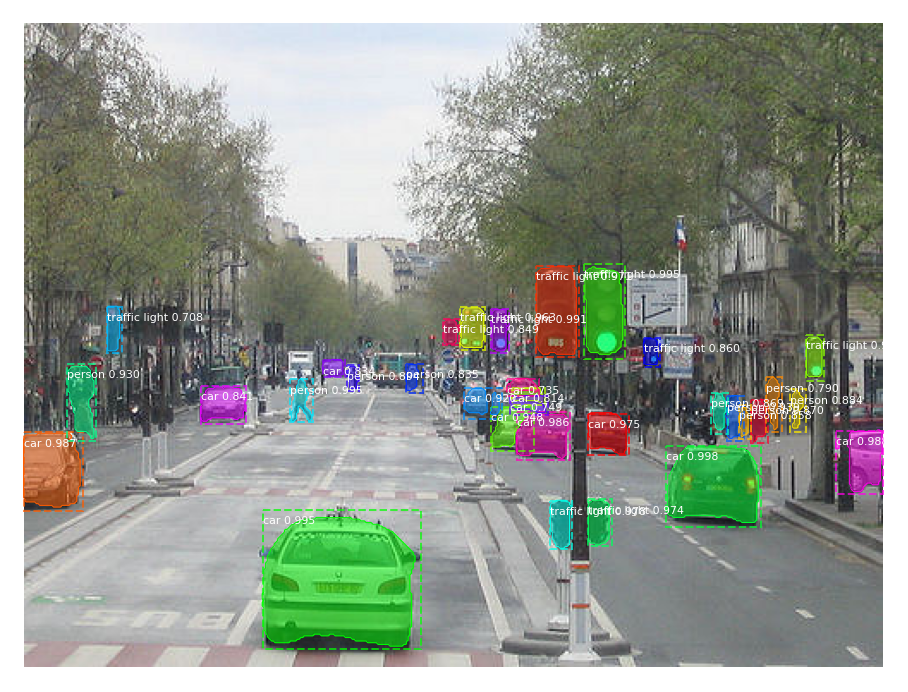

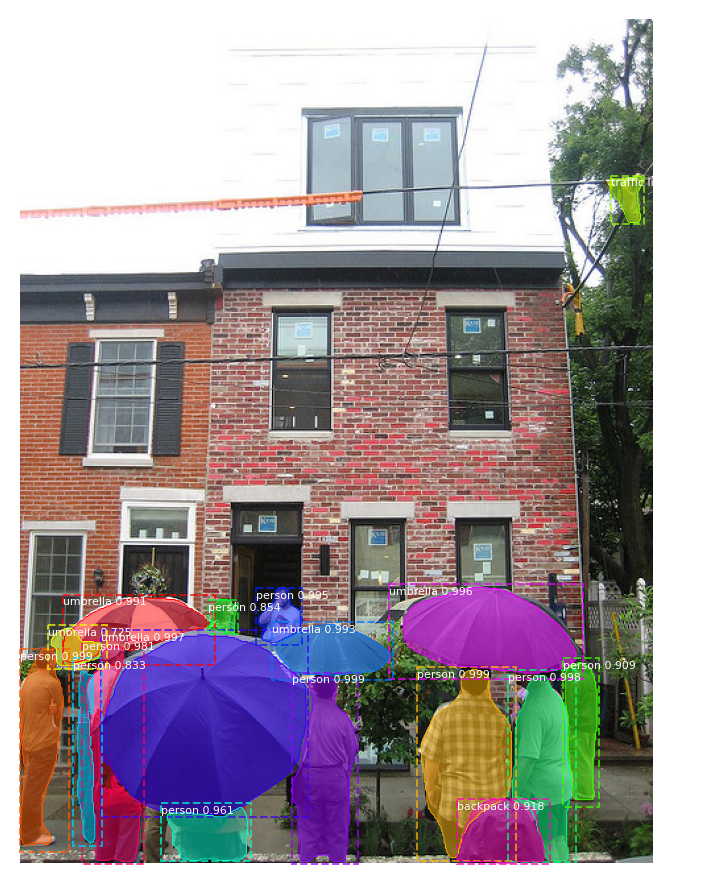

In [ ]:
cnt = 0

for image in images:
  
  current_image = skimage.io.imread(image)
  (H, W) = current_image.shape[:2]

  # Run detection
  results = model.detect([current_image], verbose=0)
  
  # Visualize results
  r = results[0]
  visualize.display_instances(current_image, r['rois'], r['masks'], 
                              r['class_ids'], class_names, r['scores'])
  
  cnt+=1
  
  if cnt==10: 
    break

### Background Removal

In [ ]:
def segment(image, r):
  idx = r['scores'].argmax()
  mask = r['masks'][:,:,idx]
  mask = np.stack((mask,)*3, axis=-1)
  mask = mask.astype('uint8')
  bg = 255 - mask * 255
  mask_img = image*mask
  result = mask_img+ bg
  return result

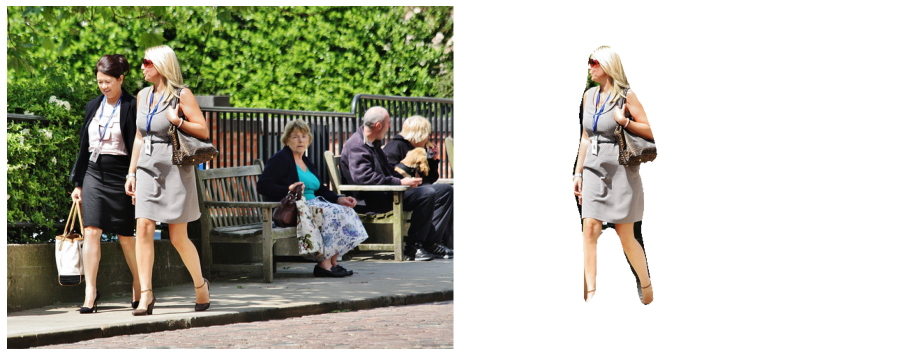

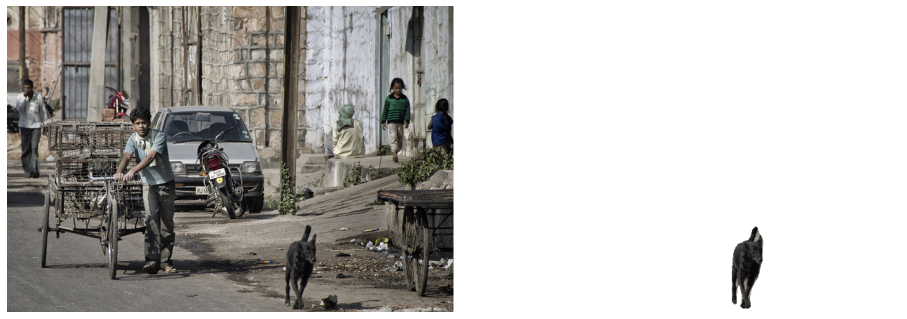

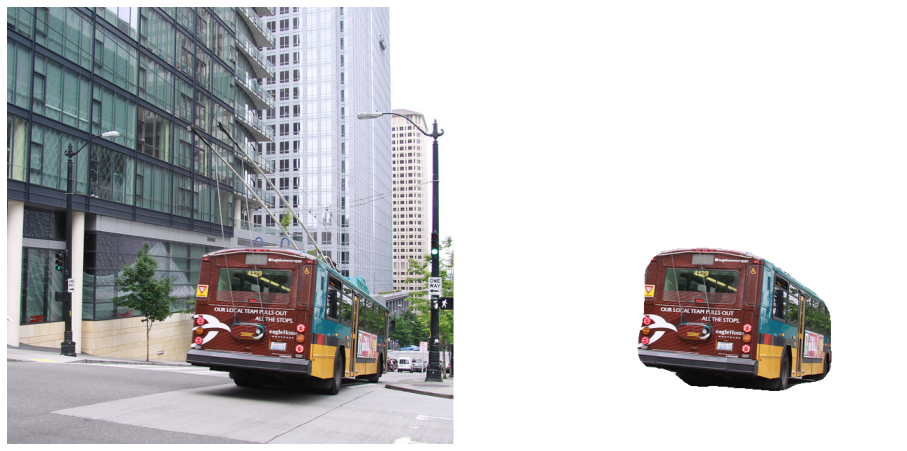

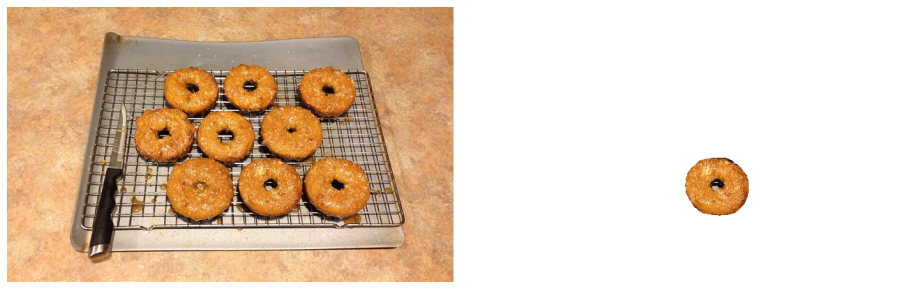

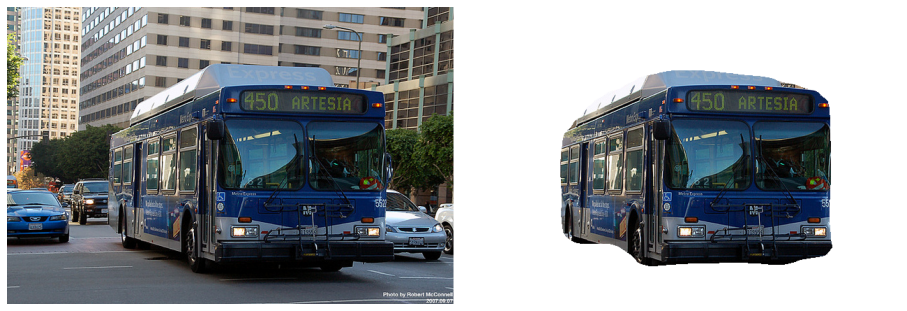

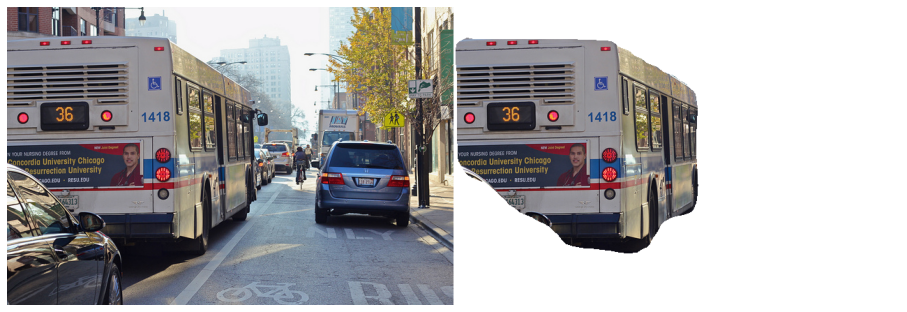

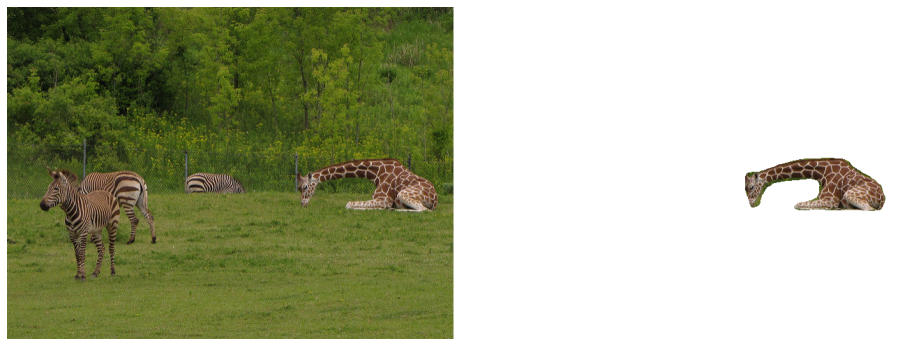

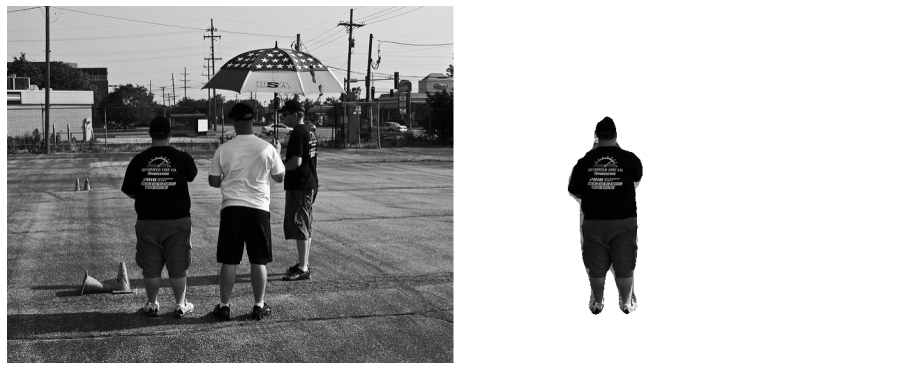

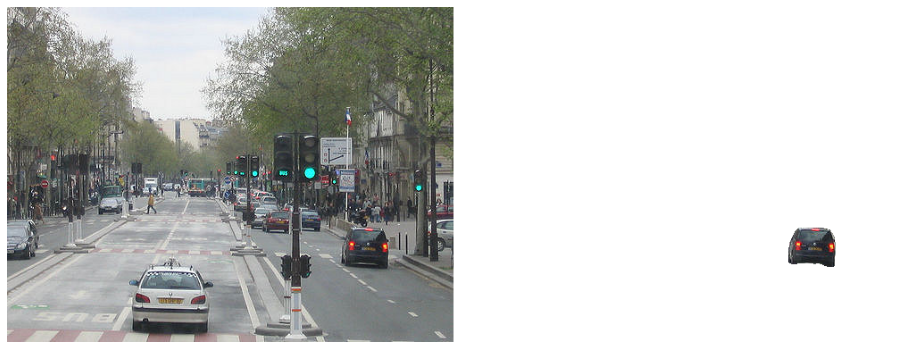

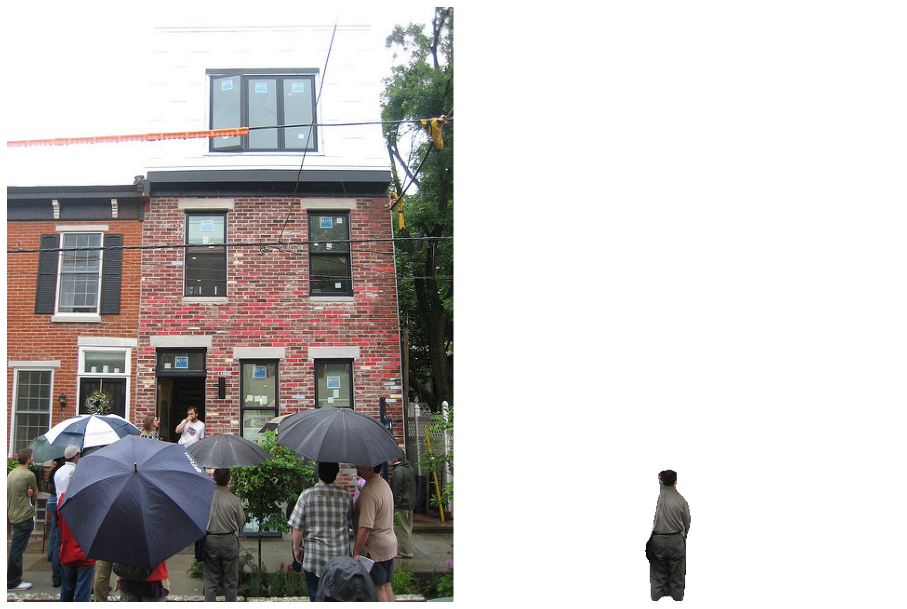

In [ ]:
cnt = 0

for image in images:

  current_image = skimage.io.imread(image)
  (H, W) = current_image.shape[:2]

  # Run detection
  results = model.detect([current_image], verbose=0)
  
  # Visualize results
  r = results[0]

  segmentation = segment(current_image, r)
  plt.subplots(1, figsize=(16, 16))
  plt.axis('off')
  plt.imshow(np.concatenate([current_image, segmentation], axis = 1))

  cnt+=1
  if cnt==10: 
    break